<a href="https://colab.research.google.com/github/GabrielCabas/Summer_Course_ML/blob/main/Histology_tissue_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Let's download data as a first step to win time 😀

In [1]:
import kagglehub
CRC_FOLDER = imrankhan77_crc_val_he_7k_path = kagglehub.dataset_download('imrankhan77/crc-val-he-7k')
print(CRC_FOLDER)
NCT_FOLDER = imrankhan77_nct_crc_he_100k_path = kagglehub.dataset_download('imrankhan77/nct-crc-he-100k')
print(NCT_FOLDER)

print('Data source import complete.')

/root/.cache/kagglehub/datasets/imrankhan77/crc-val-he-7k/versions/1
/root/.cache/kagglehub/datasets/imrankhan77/nct-crc-he-100k/versions/1
Data source import complete.


# Histology tissue classification using Deep Learning models

The main purpose of this practical notebook is to apply a deep learning model to solve a basic tissue classficiation task in histology images.

For this session, we will use two colon adenocarcinoma datasets:  [nct-crc-he-100k](https://www.kaggle.com/datasets/imrankhan77/nct-crc-he-100k) and [crc-val-he-7k](https://www.kaggle.com/datasets/imrankhan77/crc-val-he-7k). These two datasets contain tissue tiles classified with nine labels:

*   ADI: Adipose
*   STR: Strome
*   TUM: Tumour
*   NORM: Normal tissue
*   BACK: Background
*   LYM: Lymphome
*   DEB: Debris
*   MUC: Mucose
*   MUS: Musculus

Each dataset has 100K and 7K tiles images and are mutually excluyent between them. i.e, There aren't any slide repeated between NCT and CRC




In addition, we will use a foundational model for histopathology as feature extractor: UNI *(Chen, 2024)*. You can check for more information about it on [Huggingface](https://huggingface.co/MahmoodLab/UNI) 🤗 and the [arcticle](https://www.nature.com/articles/s41591-024-02857-3)


We will apply some Machine Learning algorithms using the extracted features, and then, select and optimize for our final prediction

LET'S GO

## Dependences, tokens, data and GPUs



First of all, let's install [Optuna](https://optuna.org/). We will use it later for model optimization. All other packages and libraries are included in google collab base environment, so we don't need to install it.

In [2]:
!pip install optuna

We will disable warnings for to simplify the visualization

In [3]:
import warnings
warnings.filterwarnings('ignore')

Google collab provides free but limited access to a NVIDIA T4 (suficient for this demo). For an unlimited use of NVIDIA P40 on cloud, you can this Kaggle [notebook](https://www.kaggle.com/code/gabrielcabas/histology-tissue-classification).  Kaggle provides two NVIDIA T4 and one  NVIDIA P100 . Otherwise, you can always download this notebook and use it on your laptop or adapt it to use on an HPC.

Our last dependence is the permission of the authors of UNI to use this model. **Only for this time** we will use my token as a group. If you decide to use it further please request access via Huggingface.

Use Secrets to insert and import the token


In [4]:
#Token
from huggingface_hub import login
from google.colab import userdata
token = userdata.get('huggingface_token')
login(token = token)

And import the necessary libraries

In [5]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os #Operative system calls and files
import matplotlib.pyplot as plt #Data visualization
import seaborn as sns #Wrapper for plt
from PIL import Image #Image open
import tqdm

In [6]:
#ML dependences
import torch
import torchvision
from torch.utils.data import DataLoader
import timm
from timm.data import resolve_data_config
from timm.data.transforms_factory import create_transform
from torchvision import transforms
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix
import optuna

This is just a function for to clear the GPU and free memory.

In [7]:
def clear_gpu(): #Function to clear cache in emergency case D:
    torch.cuda.empty_cache()

In [8]:
clear_gpu()

And because everyone loves gg-plot, we will import this styles

In [9]:
plt.style.use('ggplot')

## Exploratory data analysis

In [10]:
NCT_FOLDER = f"{NCT_FOLDER}/NCT-CRC-HE-100K"
CRC_FOLDER = f"{CRC_FOLDER}/CRC-VAL-HE-7K"

 This function only list files in main folders and stores it on a dataframe

In [11]:
def list_files(dataset_folder):
    data = []
    for folder, subdir, file in os.walk(dataset_folder):
        label = os.path.basename(folder)
        if file != []:
            tiles = pd.DataFrame(file, columns=["tile"])
            tiles["label"] = label
            data.append(tiles)
    data = pd.concat(data)
    return data

We will use NCT dataset for training

In [12]:
nct_df = list_files(NCT_FOLDER)
nct_df

,tile,label
0,LYM-IPATNENE.tif,LYM
1,LYM-AMPFTGNY.tif,LYM
2,LYM-HSGCAMDA.tif,LYM
3,LYM-GICTIDEM.tif,LYM
4,LYM-AIAKQLNP.tif,LYM
...,...,...
10441,STR-LDLKFWDP.tif,STR
10442,STR-NYFVLHCY.tif,STR
10443,STR-TKADQWIS.tif,STR
10444,STR-NGLCQDIM.tif,STR


 And CRC for testing

In [13]:
crc_df = list_files(CRC_FOLDER)
crc_df

,tile,label
0,LYM-TCGA-CWRTPQDC.tif,LYM
1,LYM-TCGA-VPFNHFVA.tif,LYM
2,LYM-TCGA-HLDITDFK.tif,LYM
3,LYM-TCGA-IENFKAHF.tif,LYM
4,LYM-TCGA-NLYLIVFF.tif,LYM
...,...,...
416,STR-TCGA-CVVIKMLV.tif,STR
417,STR-TCGA-PLYYFCPQ.tif,STR
418,STR-TCGA-WPVVEPNE.tif,STR
419,STR-TCGA-CWFRNDPA.tif,STR


Let's show the labels distribution over tiles

<Axes: title={'center': 'CRC-VAL-HE-100k'}, xlabel='label', ylabel='Count'>

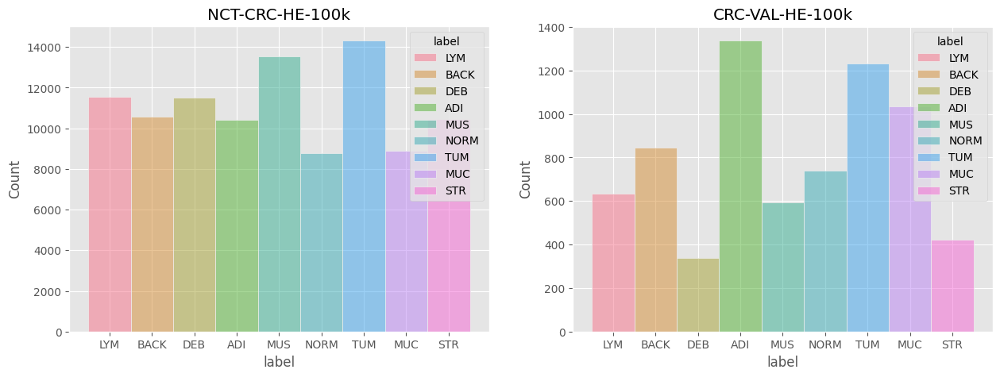

In [14]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.title("NCT-CRC-HE-100k")
sns.histplot(nct_df, hue="label", x="label")
plt.subplot(1,2,2)
plt.title("CRC-VAL-HE-100k")
sns.histplot(crc_df, hue="label", x="label")

This function show some random tiles per label in each dataset

In [15]:
def show_tiles(df, dataset_folder):
  plt.figure(figsize= (15, 30))
  sample_n = 5
  plt.suptitle(dataset_folder.split("/")[-1], size=20)
  labels = df.label.unique()
  for id_label, label in enumerate(labels):
      sample = df[df.label == label].sample(5).reset_index(drop=True)
      for index, row in sample.iterrows():
          path = f"{dataset_folder}/{label}/{row.tile}"
          img = Image.open(path)
          plt.subplot(len(labels), sample_n, (id_label*sample_n) + index+1)
          if index == 0:
              plt.ylabel(label)
          plt.imshow(img)
  plt.tight_layout()

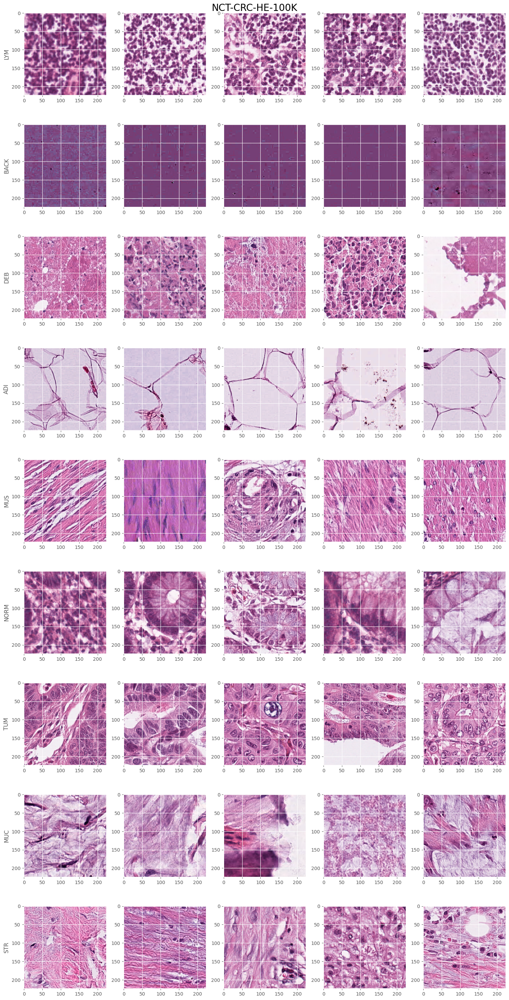

In [16]:
show_tiles(nct_df, NCT_FOLDER)

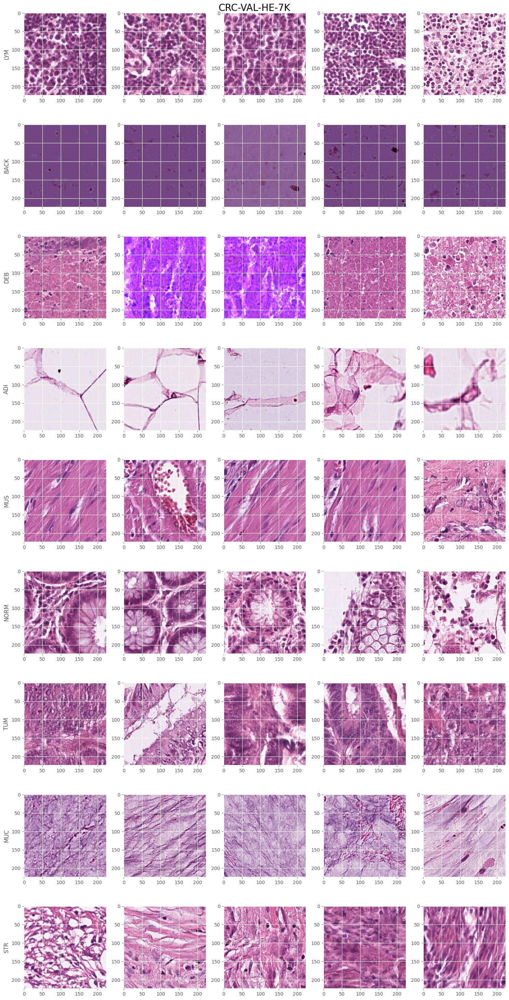

In [17]:
show_tiles(crc_df, CRC_FOLDER)

## Import model

Let's use cuda for to import model and data in the GPU

In [18]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

And to use timm (Huggingface) to download UNI model and mount it in the GPU

In [19]:
# Проверка доступности GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [20]:
# Загрузка модели (например, ResNet-50)
model_name = "resnet50"
feature_extractor = timm.create_model(model_name, pretrained=True)

# Перемещение модели на GPU
feature_extractor.to(device)

# Проверка устройства модели
print(next(feature_extractor.parameters()).device)

cuda:0
